# Kickstarter Projects

# 1.必要ライブラリーの導入と可視化

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
%matplotlib inline

In [2]:
df=pd.read_csv("data/ks-projects-201801.csv")

In [41]:
pandas_profiling.ProfileReport(df)

①Distinctが90%以上のものに関しては1つのカテゴリーに対してのデータ数が少ないので説明変数としては不適であると考えた。<br>
"ID","name" <br>
②似たものを1カテゴリーへと変更する。<br>
"category"と"main_category"は包括関係があるため"main_category"のみを採用とする。<br>
"usd pledged"と"usd_pledged_real"は相関係数が1に近く、"goal"と"usd_goal_real"は相関係数が1に近くなることがヒートマップから分かるので、"usd pledged"と"goal"のみを採用することとする。

# 2.欠損値処理

本データの欠損値の数を確認する。

In [3]:
df.isnull().sum()

ID                     0
name                   4
category               0
main_category          0
currency               0
deadline               0
goal                   0
launched               0
pledged                0
state                  0
backers                0
country                0
usd pledged         3797
usd_pledged_real       0
usd_goal_real          0
dtype: int64

"name"に関してはnodataに置き換える。
理由：要素数4つと少ないため一つの要素nodataとすることにする。

In [4]:
df=df.fillna({"name":"nodata"})

"usd pledged"はほとんどが0に偏っているので約1.0%に及ぶ欠損値を0で穴埋めすることにする。

In [5]:
df=df.fillna({"usd pledged":0})

In [6]:
df.isnull().sum()

ID                  0
name                0
category            0
main_category       0
currency            0
deadline            0
goal                0
launched            0
pledged             0
state               0
backers             0
country             0
usd pledged         0
usd_pledged_real    0
usd_goal_real       0
dtype: int64

# 3.前処理

# 3.1deadline

In [7]:
df["deadline"]

0         2015-10-09
1         2017-11-01
2         2013-02-26
3         2012-04-16
4         2015-08-29
             ...    
378656    2014-10-17
378657    2011-07-19
378658    2010-08-16
378659    2016-02-13
378660    2011-08-16
Name: deadline, Length: 378661, dtype: object

In [8]:
import datetime
df["deadline"]=pd.to_datetime(df["deadline"])
df["deadline_year"]=df["deadline"].dt.year

In [9]:
df["deadline_month"]=df["deadline"].dt.month

In [10]:
df["deadline_day"]=df["deadline"].dt.day

In [11]:
df=df.drop('deadline',axis=1)

# 3.2launched

In [12]:
df["launched"]=pd.to_datetime(df["launched"])
df["launched_year"]=df["launched"].dt.year
df["launched_month"]=df["launched"].dt.month
df["launched_day"]=df["launched"].dt.day

In [13]:
df=df.drop('launched',axis=1)

# 3.3量的関数変換

In [14]:
df.columns

Index(['ID', 'name', 'category', 'main_category', 'currency', 'goal',
       'pledged', 'state', 'backers', 'country', 'usd pledged',
       'usd_pledged_real', 'usd_goal_real', 'deadline_year', 'deadline_month',
       'deadline_day', 'launched_year', 'launched_month', 'launched_day'],
      dtype='object')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ID                378661 non-null  int64  
 1   name              378661 non-null  object 
 2   category          378661 non-null  object 
 3   main_category     378661 non-null  object 
 4   currency          378661 non-null  object 
 5   goal              378661 non-null  float64
 6   pledged           378661 non-null  float64
 7   state             378661 non-null  object 
 8   backers           378661 non-null  int64  
 9   country           378661 non-null  object 
 10  usd pledged       378661 non-null  float64
 11  usd_pledged_real  378661 non-null  float64
 12  usd_goal_real     378661 non-null  float64
 13  deadline_year     378661 non-null  int64  
 14  deadline_month    378661 non-null  int64  
 15  deadline_day      378661 non-null  int64  
 16  launched_year     37

In [16]:
import category_encoders as ce
def preprocess(data):
    list = []
    for i in data.columns:
        if data[i].dtype == 'object':
            list.append(i)
    oce = ce.OrdinalEncoder(cols=list,handle_unknown='impute')
    data=oce.fit_transform(data)
    return data

In [17]:
#目的変数
y = df["state"].values

In [18]:
df_x=df.drop('state',axis=1)
df_c=preprocess(df_x)

C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [19]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ID                378661 non-null  int64  
 1   name              378661 non-null  int32  
 2   category          378661 non-null  int32  
 3   main_category     378661 non-null  int32  
 4   currency          378661 non-null  int32  
 5   goal              378661 non-null  float64
 6   pledged           378661 non-null  float64
 7   backers           378661 non-null  int64  
 8   country           378661 non-null  int32  
 9   usd pledged       378661 non-null  float64
 10  usd_pledged_real  378661 non-null  float64
 11  usd_goal_real     378661 non-null  float64
 12  deadline_year     378661 non-null  int64  
 13  deadline_month    378661 non-null  int64  
 14  deadline_day      378661 non-null  int64  
 15  launched_year     378661 non-null  int64  
 16  launched_month    37

In [20]:
col=[]
for i in df_c.columns:
    col.append(i)
col

['ID',
 'name',
 'category',
 'main_category',
 'currency',
 'goal',
 'pledged',
 'backers',
 'country',
 'usd pledged',
 'usd_pledged_real',
 'usd_goal_real',
 'deadline_year',
 'deadline_month',
 'deadline_day',
 'launched_year',
 'launched_month',
 'launched_day']

In [21]:
X=df_c.values

# 4.基本処理の定義

基本となるモデル検証を行える処理を定義しておく<br>
・クロスバリエーション<br>
・混同行列を表示する

In [22]:
from sklearn.model_selection import KFold
from  sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV

#交差検証法の利用
def crossValidation(model, X, y, a):
    kf = KFold(n_splits=5, random_state=1234, shuffle=True)
    kf.get_n_splits(X, y)
    df_result = pd.DataFrame()
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        if a==1:
            stdsc = StandardScaler()
            X_train = stdsc.fit_transform(X_train)
            X_test = stdsc.transform(X_test)
        model.fit(X_train, y_train)
        score = []
        train_score = model.score(X_train,y_train)
        test_score = model.score(X_test,y_test)
        score.append(train_score)
        score.append(test_score)
        y_pred = model.predict(X_test)
        df = pd.DataFrame({"y_test":y_test, "y_pred":y_pred,})
        df_result = pd.concat([df_result, df], axis=0)
    return model, df_result ,score


#混同行列を求める
def ConfusionMatrix(y_test,y_pred):
    labels=["canceled","failed","live","successful","suspended","undefined"]
    conf_mat = confusion_matrix(y_test,y_pred)
    print(conf_mat)
    # 正答率を計算
    accuracy =  accuracy_score(y_test, y_pred)
    print('正答率（Accuracy） = {:.3f}%'.format(100 * accuracy))
    # Precision, Recall, F1-scoreを計算
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred)
    print('適合率（Precision） = {:.3f}%'.format(100 * precision[0]))
    print('再現率（Recall） = {:.3f}%'.format(100 * recall[0]))
    print('F1値（F1-score） = {:.3f}%'.format(100 * f1_score[0]))

# 5.特徴量探索

フィルタ法

<AxesSubplot:>

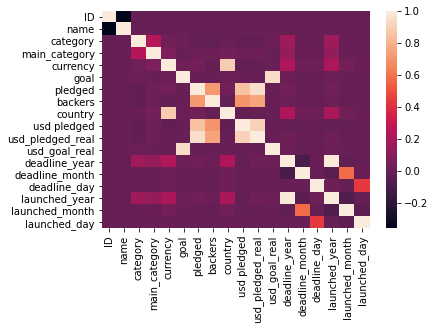

In [23]:
sns.heatmap(df_c.corr())

"ID","name"については説明変数に選ぶには不適なのでcol_dropに入れる。<br>
"country"と"currency"、"uds pledged"と"pledged"と"usd_pledged_real"、"goal"と"usd_goal_real"、"deadline_year"と"launched_year"は相関係数が大きいのでそれぞれ、"currency","pledged","goal","deadline_year"を残すことにする。<br>

In [24]:
col_drop=["ID","name","country","usd pledged","usd_goal_real","usd_pledged_real","launched_year"]
df_d=df_c.drop(columns=col_drop)
X=df_d.values

In [25]:
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   category        378661 non-null  int32  
 1   main_category   378661 non-null  int32  
 2   currency        378661 non-null  int32  
 3   goal            378661 non-null  float64
 4   pledged         378661 non-null  float64
 5   backers         378661 non-null  int64  
 6   deadline_year   378661 non-null  int64  
 7   deadline_month  378661 non-null  int64  
 8   deadline_day    378661 non-null  int64  
 9   launched_month  378661 non-null  int64  
 10  launched_day    378661 non-null  int64  
dtypes: float64(2), int32(3), int64(6)
memory usage: 27.4 MB


In [26]:
cols=[]
for i in df_d.columns:
    cols.append(i)

# 7.モデルの検証

・SVM <br>
・ロジスティック回帰 <br>
・ランダムフォレスト <br>
・アダブースト <br>
・k近傍法

# 7.1SVM

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

#学習データとテストデータを分割する
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

#標準化
stdsc = StandardScaler()
X_train = stdsc.fit_transform(X_train)
X_test = stdsc.transform(X_test)

In [39]:
from sklearn.svm import LinearSVC

model_svc=LinearSVC()
model_svc,result_s,score_s=crossValidation(model_svc,X,y,1)

C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarni

In [40]:
y_test=result_s["y_test"]
y_pred=result_s["y_pred"]
ConfusionMatrix(y_test,y_pred)

[[   132  37306    241    984    116      0]
 [   322 194480    133   2576    208      0]
 [     0      9   2691     99      0      0]
 [    31  59660     78  74185      2      0]
 [     4   1606     19    215      2      0]
 [     0   3559      0      3      0      0]]
正答率（Accuracy） = 71.697%
適合率（Precision） = 26.994%
再現率（Recall） = 0.340%
F1値（F1-score） = 0.672%


C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# 7.2ロジスティック回帰

In [36]:
from sklearn.linear_model import SGDClassifier

clf_logistic = SGDClassifier(loss='log', penalty='none', max_iter=10000, fit_intercept=True, random_state=1234, tol=1e-3)
model_l,result_l,score_l=crossValidation(clf_logistic,X,y,0)

In [37]:
y_test=result_l["y_test"]
y_pred=result_l["y_pred"]
ConfusionMatrix(y_test,y_pred)

[[    19  26447    208   6973      0   5132]
 [   170 136645    710  36461      0  23733]
 [     3   1573      6    946      0    271]
 [     0   9363      0 123832      0    761]
 [     8   1058      3    564      0    213]
 [     0   1821      0   1352      0    389]]
正答率（Accuracy） = 68.898%
適合率（Precision） = 9.500%
再現率（Recall） = 0.049%
F1値（F1-score） = 0.097%


C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# 7.3ランダムフォレスト

In [28]:
from sklearn.ensemble import RandomForestClassifier

model_r=RandomForestClassifier(min_samples_leaf=3,random_state=0)
model_r,result_r,score_r=crossValidation(model_r,X,y,0)

C:\Users\nagai-yuta\anaconda3\envs\skillupai\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[[  1262  36271    217   1022      1      6]
 [  2207 194163     36   1269      1     43]
 [     4     16   2767     12      0      0]
 [    10    119     22 133781      0     24]
 [    35   1465     19    326      0      1]
 [     2    144      0      3      0   3413]]
正答率（Accuracy） = 88.572%
適合率（Precision） = 35.852%
再現率（Recall） = 3.254%
F1値（F1-score） = 5.967%


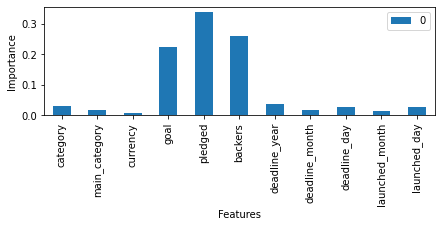

In [31]:
y_test=result_r["y_test"]
y_pred=result_r["y_pred"]
ConfusionMatrix(y_test,y_pred)
pd.DataFrame(model_r.feature_importances_, index=cols).plot.bar(figsize=(7,2))
plt.ylabel("Importance")
plt.xlabel("Features")
plt.show()

# 7.4アダブースト

In [32]:
from sklearn.ensemble import AdaBoostClassifier

model_a = AdaBoostClassifier(DecisionTreeClassifier(max_depth=3,min_samples_leaf=2,min_samples_split=2, random_state=1234,criterion="gini"),
                         n_estimators=10, random_state=1234)
model_a,result_a,score_a=crossValidation(model_a,X,y,0)

[[   518  34060    161   1844   1999    197]
 [  1304 174773     99   6713  13922    908]
 [   745     86   1845     68     55      0]
 [  1166  25937     68 105745    987     53]
 [    35   1440     15    268     83      5]
 [   173    749      0     91      6   2543]]
正答率（Accuracy） = 75.399%
適合率（Precision） = 13.144%
再現率（Recall） = 1.336%
F1値（F1-score） = 2.425%


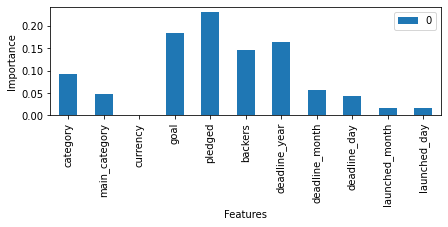

In [33]:
y_test=result_a["y_test"]
y_pred=result_a["y_pred"]
ConfusionMatrix(y_test,y_pred)

# 説明変数の重要度を出力する
# scikit-learnで算出される重要度は、ある説明変数による不純度の減少量合計である。
pd.DataFrame(model_a.feature_importances_, index=cols).plot.bar(figsize=(7,2))
plt.ylabel("Importance")
plt.xlabel("Features")
plt.show()

# 7.5K近傍法

In [34]:
from sklearn.neighbors import KNeighborsClassifier

#学習データとテストデータを分割する
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

model_k=KNeighborsClassifier(n_neighbors=3)
model_k,result_k,score_k=crossValidation(model_k,X,y,0)

In [35]:
y_test=result_k["y_test"]
y_pred=result_k["y_pred"]
ConfusionMatrix(y_test,y_pred)

[[  3960  34009     15    723     11     61]
 [ 16691 180368     93    105     49    413]
 [   257   2057     24    452      0      9]
 [   119     36     21 133610      9    161]
 [   175   1366      4    293      5      3]
 [   192   1523      5    747      0   1095]]
正答率（Accuracy） = 84.261%
適合率（Precision） = 18.510%
再現率（Recall） = 10.212%
F1値（F1-score） = 13.162%


# 8.まとめ

多クラス分類において正答率は高い精度が得られたがF1値などの結果は良いものとはいいがたい。 <br>
より高性能な結果を取るために考えられる要因としては以下が挙げられる。<br>
①モデルに適した前処理を行う（今回はフィルタ法を用いた）<br>
ex.ラッパー法、埋め込み法<br>
②モデルのパラメータチューニングを行う（今回は未実施）<br>
ex.GridSearch(時間かかる),ランダムサーチ<br>
③複雑なモデルを作る<br>
CNNなど複雑なモデルはあるので多クラス分類においても精度の高いモデルを目指す。